<a href="https://colab.research.google.com/github/apopodko/BeamCenterFinder/blob/master/text_image_retrieval.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [25]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Поиск по изображениям

Вы работаете в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”). Ваши пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Ваш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Сервис выводит несколько фотографий с такой же или похожей сценой.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Вам поручено разработать демонстрационную версию поиска изображений по запросу.

## Описание проекта

**Заказчик**
Фотохостинг для профессиональных фотографов «Со Смыслом»


**Входные данные**
Изображения, идентификаторы описания, тексты описанияб оценки экспертов и краудсорсинга по соответствию описания и изображения


**Задача**
Исследовать данные, определить и исключить изображения, подпадающие под юридические ограничения. Создать модель по поиску изображения, соответствующего описаниию запроса

**Цель**
Разработать демонстрационную версию поиска изображений по запросу в качестве PoC для презентации заказчику

**Описание входных данных**

**Путь к входным данным прописан ниже в константах `DATA_PATH`**
- `train_dataset.csv` - тренировочный датасет, содержащий имя файла изображения, идентификатор описания и текст описания
    - `image` - имя файла изображения
    - `query_id` - идентификатор описания
    - `query_text` - текстовое описание
    
    
- `test_queries.csv` - тестовый датасет с идентификатором запроса, текстом запроса и релевантными изображениями


- `CrowdAnnotations.tsv` - данные по соответствию изображения и описания, полученные с помощью краудсорсинга
    - `image` - имя файла изображения
    - `query_id` - идентификатор описания
    - `match_score` - доля людей, подтвердивших, что описание соответствует изображению
    - `pos_match_count` - количество человек, подтвердивших, что описание соответствует изображению
    - `neg_match_count` - количество человек, подтвердивших, что описание не соответствует изображению
    
    
- `ExpertAnnotations.tsv` - данные по соответствию изображения и описания, полученные в результате опроса экспертов
    - `image` - имя файла изображения
    - `query_id` - идентификатор описания
    - `expert_val_1` - оценка первого эксперта соответствия изображения описанию
    - `expert_val_2` - оценка второго эксперта соответствия изображения описанию
    - `expert_val_3` - оценка третьего эксперта соответствия изображения описанию
    
    
- `train_images` - папка с тренировочной выборкой изображений
- `test_images` - папка с тестовой выборкой изображений

In [26]:
!pip install keras==3.8.0
!pip install matplotlib==3.10.0
!pip install numpy==2.0.2
!pip install pandas==2.2.2
!pip install scikit-learn==1.6.1
!pip install seaborn==0.13.2
!pip install spacy==3.8.5
!pip install tensorflow[and-cuda]==2.18.0
!pip install tqdm==4.67.1
!pip install transformers==4.51.1

In [27]:
import pandas as pd
import numpy as np
import os
from collections import Counter
from tqdm.notebook import tqdm, trange
import re
import random

import matplotlib.pyplot as plt
from textwrap import wrap
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor
from sklearn.metrics import root_mean_squared_error
from sklearn.model_selection import GroupShuffleSplit

import tensorflow as tf
from tensorflow.keras.applications.inception_resnet_v2 import (
    InceptionResNetV2,
    preprocess_input
)
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Lambda
from tensorflow.keras import Model, Input
from tensorflow.keras import layers, models
from PIL import Image
import spacy
from transformers import (
    BertTokenizer,
    TFBertModel,
    ViTFeatureExtractor,
    TFViTModel,
    CLIPProcessor,
    TFCLIPModel
)
from collections import defaultdict
DATA_PATH = '/content/drive/MyDrive/Colab Notebooks/Image_text_retrieval'
TRAIN_IMAGES_DIR = 'train_images/'
TEST_IMAGES_DIR = 'test_images/'
SEED = 42
RANDOM_STATE = 42
tf.random.set_seed(12345)
np.random.seed(12345)
tqdm.pandas()

## Импорт данных и разведочный анализ

In [28]:
def analyze(data):

    print('Общая информация о признаках\n')
    data.info()

    print('\nПервые пять строк датасета')
    display(data.head())

    print('\nСтатистика по признакам')
    display(data.describe())

    stats = {'values' : [
                         'Unique, count',
                         'Unique, %',
                         'Missing, count',
                         'Missing, %'
                        ]}
    for col in data:
        stats[col] = [
                      data[col].nunique(),
                      round(100 * data[col].nunique() / data.shape[0], 2),
                      data[col].isnull().sum(),
                      round(100 * data[col].isnull().sum() / data.shape[0], 2)
                     ]
    stats = pd.DataFrame(stats).set_index('values').T
    print('\nСтатистика по уникальным значениям и пропускам')
    display(stats.sort_values('Missing, %', ascending=False))

    print(f'\nПолных явных дубликатов - {data.duplicated().sum()}')
    print('\nУникальные значения')
    for col in data:
        if data[col].nunique() < 15:
            print(f'Признак {col}, значения:', np.sort(data[col].unique()))

Импортируем все таблицы

In [29]:
df_train = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))

df_crowd = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'),
                       sep='\t',
                       header=None,
                       names=['image',
                              'query_id',
                              'crowd_mean_score',
                              'crowd_pos_count',
                              'crowd_neg_count'])

df_expert = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'),
                        sep='\t',
                        header=None,
                        names=['image',
                               'query_id',
                               'expert_val_1',
                               'expert_val_2',
                               'expert_val_3'])

df_test = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), index_col=0,
                     sep='|')

### `train_dataset`

In [30]:
analyze(df_train)

Общая информация о признаках

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Первые пять строк датасета


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



Статистика по признакам


,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,2083434441_a93bc6306b.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34



Статистика по уникальным значениям и пропускам


values,"Unique, count","Unique, %","Missing, count","Missing, %"
image,1000.0,17.18,0.0,0.0
query_id,977.0,16.78,0.0,0.0
query_text,977.0,16.78,0.0,0.0



Полных явных дубликатов - 0

Уникальные значения


- 5822 записи
- Пропусков нет
- Полных дубликатов нет
- Уникальных элементов по признакам
    - `image` - 1000 изображений
    - `query_id` - 977 айди запросов
    - `query_text` - 977 текстов запросов
- У всех `query_id` стоит #2, на каждую картинку может быть больше 5 разных запросов

### `CrowdAnnotations`

In [31]:
analyze(df_crowd)

Общая информация о признаках

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             47830 non-null  object 
 1   query_id          47830 non-null  object 
 2   crowd_mean_score  47830 non-null  float64
 3   crowd_pos_count   47830 non-null  int64  
 4   crowd_neg_count   47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Первые пять строк датасета


,image,query_id,crowd_mean_score,crowd_pos_count,crowd_neg_count
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3



Статистика по признакам


,crowd_mean_score,crowd_pos_count,crowd_neg_count
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000



Статистика по уникальным значениям и пропускам


values,"Unique, count","Unique, %","Missing, count","Missing, %"
image,1000.0,2.09,0.0,0.0
query_id,1000.0,2.09,0.0,0.0
crowd_mean_score,12.0,0.03,0.0,0.0
crowd_pos_count,6.0,0.01,0.0,0.0
crowd_neg_count,7.0,0.01,0.0,0.0



Полных явных дубликатов - 0

Уникальные значения
Признак crowd_mean_score, значения: [0.         0.16666667 0.2        0.25       0.33333333 0.4
 0.5        0.6        0.66666667 0.75       0.8        1.        ]
Признак crowd_pos_count, значения: [0 1 2 3 4 5]
Признак crowd_neg_count, значения: [0 1 2 3 4 5 6]


- 47830 записей
- Пропусков нет
- Полных дубликатов нет
- Уникальных элементов по признакам
    - `image` - 1000 изображений
    - `query_id` - **1000** айди запросов, отличается от `train_dataset`
    - `crowd_mean_score` - 12 степеней средней оценки от 0 до 1 включительно
    - `crowd_pos_count` - целые от 0 до 5, то есть максимально 5 человек проголосовало за соответствие
    - `crowd_neg_count` - целые от 0 до 6, то есть максимально **6** человек проглосовало за несоответствие

### `ExpertAnnotations`

In [32]:
analyze(df_expert)

Общая информация о признаках

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image         5822 non-null   object
 1   query_id      5822 non-null   object
 2   expert_val_1  5822 non-null   int64 
 3   expert_val_2  5822 non-null   int64 
 4   expert_val_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB

Первые пять строк датасета


,image,query_id,expert_val_1,expert_val_2,expert_val_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2



Статистика по признакам


,expert_val_1,expert_val_2,expert_val_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000



Статистика по уникальным значениям и пропускам


values,"Unique, count","Unique, %","Missing, count","Missing, %"
image,1000.0,17.18,0.0,0.0
query_id,977.0,16.78,0.0,0.0
expert_val_1,4.0,0.07,0.0,0.0
expert_val_2,4.0,0.07,0.0,0.0
expert_val_3,4.0,0.07,0.0,0.0



Полных явных дубликатов - 0

Уникальные значения
Признак expert_val_1, значения: [1 2 3 4]
Признак expert_val_2, значения: [1 2 3 4]
Признак expert_val_3, значения: [1 2 3 4]


- 5822 записи
- Пропусков нет
- Полных дубликатов нет
- Уникальных элементов по признакам
    - `image` - 1000 изображений
    - `query_id` - 977 айди запросов, так же как и в `train_dataset`
    - `expert_val_1` - натуральные от 1 до 4 включительно
    - `expert_val_2` - натуральные от 1 до 4 включительно
    - `expert_val_3` - натуральные от 1 до 4 включительно

### `test_queries`

In [33]:
analyze(df_test)

Общая информация о признаках

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Первые пять строк датасета


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg



Статистика по признакам


,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,989851184_9ef368e520.jpg#4,The black dog has a toy in its mouth and a per...,1177994172_10d143cb8d.jpg
freq,1,1,5



Статистика по уникальным значениям и пропускам


values,"Unique, count","Unique, %","Missing, count","Missing, %"
query_id,500.0,100.0,0.0,0.0
query_text,500.0,100.0,0.0,0.0
image,100.0,20.0,0.0,0.0



Полных явных дубликатов - 0

Уникальные значения


- 500 записей
- Пропусков нет
- Полных дубликатов нет
- Уникальных элементов по признакам
    - `image` - 100 изображений
    - `query_id` - 500 айди запросов
    - `query_text` - 500 текстов запросов

### `train_images` и `test_images`

In [34]:
print('Количество изображений в папке train_images - ',
      len(next(os.walk(os.path.join(DATA_PATH, 'train_images')))[2]))
print('Количество изображений в папке test_images - ',
      len(next(os.walk(os.path.join(DATA_PATH, 'test_images')))[2]))

Количество изображений в папке train_images -  1000
Количество изображений в папке test_images -  101


- В папке `train_images` - 1000 изображений
- А вот в папке `test_images` - 101 изображение, хотя в тестовой таблице уникальных названий изображений - 100!

### Вывод

- Импортировали все датасеты успешно, пропусков и полных дубликатов нет
- В каждом 1000 уникальных объектов изображений
- `df_train` и `df_expert` - 977 уникальных объектов запросов, `df_crowd` - 1000
- Получается, что в `df_train` есть изображения без подходящего запроса, либо запросы, к которым очень хорошо подходит несколько изображений
- Всего записей
    - `df_train` - 5822
    - `df_expert` - 5822
    - `df_crowd` - 47830
- Структура оценок
    - `df_expert` - 3 эксперта с оценками от 1 до 4 включительно
    - `df_crowd` -  12 степеней средней оценки от 0 до 1 включительно
        - `crowd_pos_count` - целые от 0 до 5, то есть максимально 5 человек проголосовало за соответствие
        - `crowd_neg_count` - целые от 0 до 6, то есть максимально **6** человек проглосовало за несоответствие
- По разведочному анализу видим, что у нас
    - во всех тренировочных датасетах по 1000 изображений
    - `df_expert` и `df_train` совпадают по количеству уникальных запросов - 977, и по количеству записей
    - `df_crowd` и `df_train` отличаются, 1000 против 977, возможно какие-то дополнительные запросовые описания были
    - В любом случае будем точно объединять `df_train` и `df_expert`, экспертные оценки чаще всего поточнее, чем краудсорс, но не факт, проверим позже
    - В оценках через краудсорс в разы больше пар изображение-запрос (в 8 раз), что в теории может дать лучший результат по метрикам, но точность разметки может быть хуже, причем настолько, что испортит экспертную оценку, тоже посмотрим
    - Объединение будем производить по полям `image` и `query_id`, так как на одну и то же изображение может приходиться несколько описаний и наоборот

## Исследовательский анализ

### `df_train` и `df_expert`

Посмотрим на 23 изображения, для которых нет описания

In [35]:
images_list_ = df_train['image'].unique() + '#2'
set(images_list_).difference(set(df_train['query_id'].unique()))

{'1343426964_cde3fb54e8.jpg#2',
 '2054869561_ff723e9eab.jpg#2',
 '2194494220_bb2178832c.jpg#2',
 '223299142_521aedf9e7.jpg#2',
 '2431832075_00aa1a4457.jpg#2',
 '2479162876_a5ce3306af.jpg#2',
 '2482629385_f370b290d1.jpg#2',
 '2806710650_e201acd913.jpg#2',
 '2913965136_2d00136697.jpg#2',
 '3015863181_92ff43f4d8.jpg#2',
 '3019842612_8501c1791e.jpg#2',
 '3116769029_f5a76f04ba.jpg#2',
 '3149919755_f9272b10b3.jpg#2',
 '3185371756_ff4e9fa8a6.jpg#2',
 '3203453897_6317aac6ff.jpg#2',
 '3349451628_4249a21c8f.jpg#2',
 '3375549004_beee810e60.jpg#2',
 '3387542157_81bfd00072.jpg#2',
 '3427118504_93126c83e0.jpg#2',
 '3499720588_c32590108e.jpg#2',
 '3521374954_37371b49a4.jpg#2',
 '3523559027_a65619a34b.jpg#2',
 '86412576_c53392ef80.jpg#2'}

In [36]:
df_expert.query('image=="1343426964_cde3fb54e8.jpg"')

,image,query_id,expert_val_1,expert_val_2,expert_val_3
220,1343426964_cde3fb54e8.jpg,2450299735_62c095f40e.jpg#2,1,1,1
221,1343426964_cde3fb54e8.jpg,2707873672_15e6b5d54b.jpg#2,1,1,2
222,1343426964_cde3fb54e8.jpg,300550441_f44ec3701a.jpg#2,1,1,1
223,1343426964_cde3fb54e8.jpg,3213992947_3f3f967a9f.jpg#2,1,1,2
224,1343426964_cde3fb54e8.jpg,3234115903_f4dfc8fc75.jpg#2,1,1,1
225,1343426964_cde3fb54e8.jpg,3741827382_71e93298d0.jpg#2,1,2,2
226,1343426964_cde3fb54e8.jpg,416960865_048fd3f294.jpg#2,1,2,2
227,1343426964_cde3fb54e8.jpg,522063319_33827f1627.jpg#2,2,2,2


In [37]:
df_expert.query('image=="1343426964_cde3fb54e8.jpg#2"')

,image,query_id,expert_val_1,expert_val_2,expert_val_3


- В принципе такое тоже может быть, что ни один запрос идеально не подходит для описания изображения, а подходит лишь приближенно, скорее всего оставим, но по ходу дела можно будет еще подумать
- Запроса `1343426964_cde3fb54e8.jpg#2` вообще нет
- Тем более, в краудсорсинговых оценках было полное и подходящее описание, возможно, если будем все-так объединять и с ним, то все будет в порядке
- Таблицы `df_train` и `df_expert`, как описывали в выводе, состоят из одинаковых пар изображение-запрос, проблем нет, поэтому объединим их

In [38]:
df_expert[df_expert['image']+'#2'==df_expert['query_id']].head(7)

,image,query_id,expert_val_1,expert_val_2,expert_val_3
53,1131932671_c8d17751b3.jpg,1131932671_c8d17751b3.jpg#2,4,4,4
66,115684808_cb01227802.jpg,115684808_cb01227802.jpg#2,4,4,4
80,1174629344_a2e1a2bdbf.jpg,1174629344_a2e1a2bdbf.jpg#2,4,4,4
187,1322323208_c7ecb742c6.jpg,1322323208_c7ecb742c6.jpg#2,4,4,4
339,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,4,4,4
374,1446053356_a924b4893f.jpg,1446053356_a924b4893f.jpg#2,4,4,4
393,1467533293_a2656cc000.jpg,1467533293_a2656cc000.jpg#2,4,4,4


Так же отметим, что изображение полностью соответствует запросу, когда id запроса равно названию изображения + `#2`

In [39]:
df_train = pd.merge(df_train, df_expert, on=['image', 'query_id'], how='inner')
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image         5822 non-null   object
 1   query_id      5822 non-null   object
 2   query_text    5822 non-null   object
 3   expert_val_1  5822 non-null   int64 
 4   expert_val_2  5822 non-null   int64 
 5   expert_val_3  5822 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 273.0+ KB


Да, наше предположение об одинаковости пар изображение-запрос для `df_train` и `df_expert` оказалось верным, внутренним объединением осталось все так же 5822 пары

In [40]:
sns.set(font_scale=1.2)
sns.set_style('whitegrid', {'axes.edgecolor': 'black'})

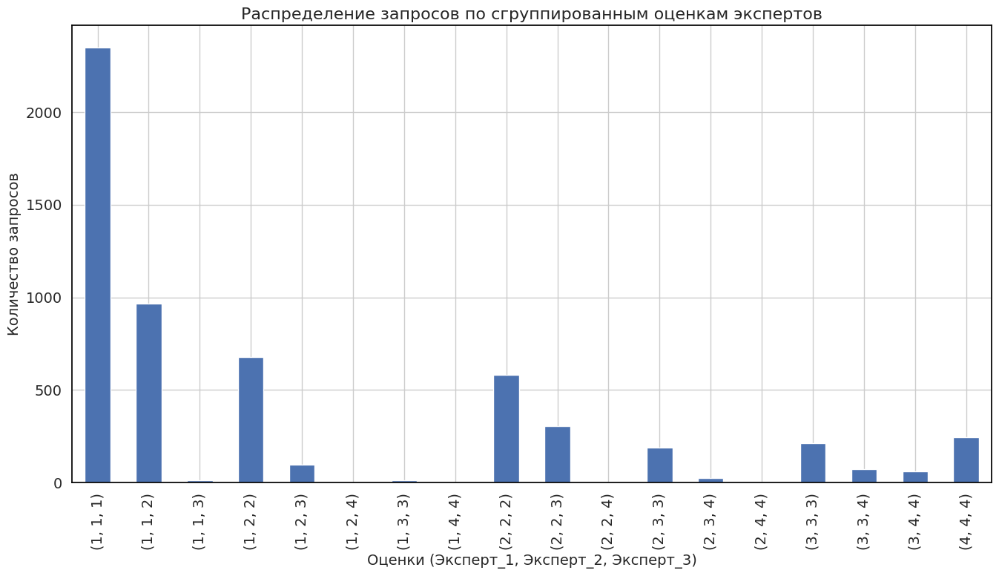

In [41]:
exp_array_ = ['expert_val_1',
              'expert_val_2',
              'expert_val_3']
(pd.DataFrame(df_train[exp_array_].value_counts())
 .sort_values(by=exp_array_)
 .plot(kind='bar', legend=False, figsize=(16, 8), fontsize=14, grid=True))
plt.xlabel('Оценки (Эксперт_1, Эксперт_2, Эксперт_3)', fontsize=14)
plt.ylabel('Количество запросов', fontsize=14)
plt.title('Распределение запросов по сгруппированным оценкам экспертов',
          fontsize=16);

- В целом эксперты более менее согласованны, хотя есть редкие случаи вроде (1, 3, 3) или (1, 4, 4) например
- Посмотрим на три стратегии аггрегации оценок
    - Среднее арифметическое, то есть все 3 эксперта равноценны и мы им одинаково доверяем
    - Мода - наиболее частая оценка среди всех экспертов, если все 3 оценки разные (3.5 % случаев) - возьмем медиану
    - Медиана - центральная из упорядоченного набора, если один эксперт зажестил например

In [42]:
def mode_agg(ratings):
    counts = Counter(list(ratings))
    mode, count = counts.most_common(1)[0]
    if count == 1:
        return int(np.median(ratings))
    else:
        return mode

df_train['exp_mode_score'] = df_train[exp_array_].apply(mode_agg, axis=1)
df_train['exp_median_score'] = df_train[exp_array_].median(axis=1)
df_train['exp_mean_score'] = df_train[exp_array_].mean(axis=1)

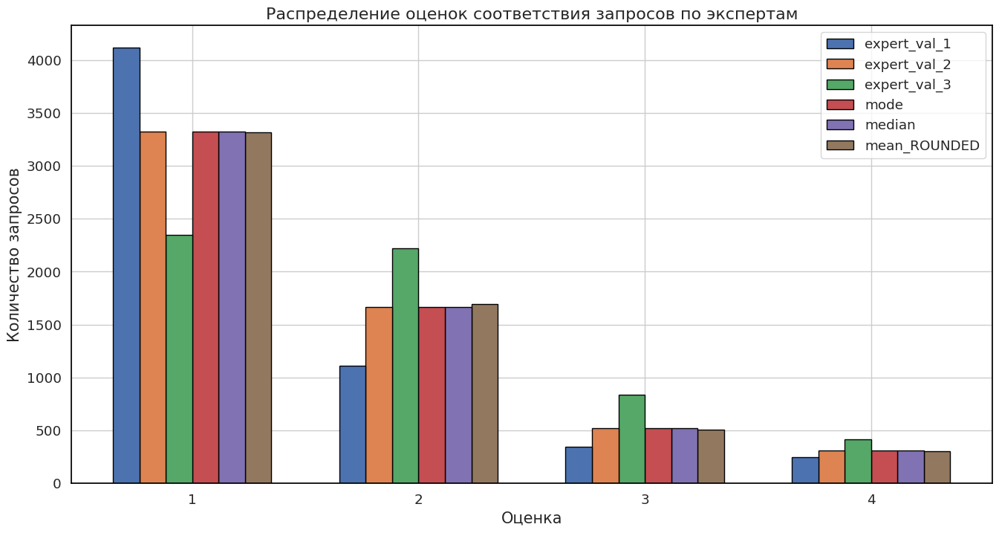

In [43]:
fig, ax = plt.subplots(figsize=(16, 8))
sns.histplot(df_train.loc[:, 'expert_val_1':'exp_mean_score'],
             stat='count',
             discrete=True,
             multiple='dodge',
             shrink=0.7,
             edgecolor='black',
             alpha=1)
plt.title('Распределение оценок соответствия запросов по экспертам',
          fontsize=16)
plt.xlabel('Оценка', fontsize=15)
plt.ylabel('Количество запросов', fontsize=15)
legend = ax.get_legend()
handles = legend.legend_handles
ax.legend(handles,
          ['expert_val_1',
           'expert_val_2',
           'expert_val_3',
           'mode',
           'median',
           'mean_ROUNDED']
         )
plt.xticks([1,2,3,4]);

/tmp/ipython-input-44-2133154967.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()]);


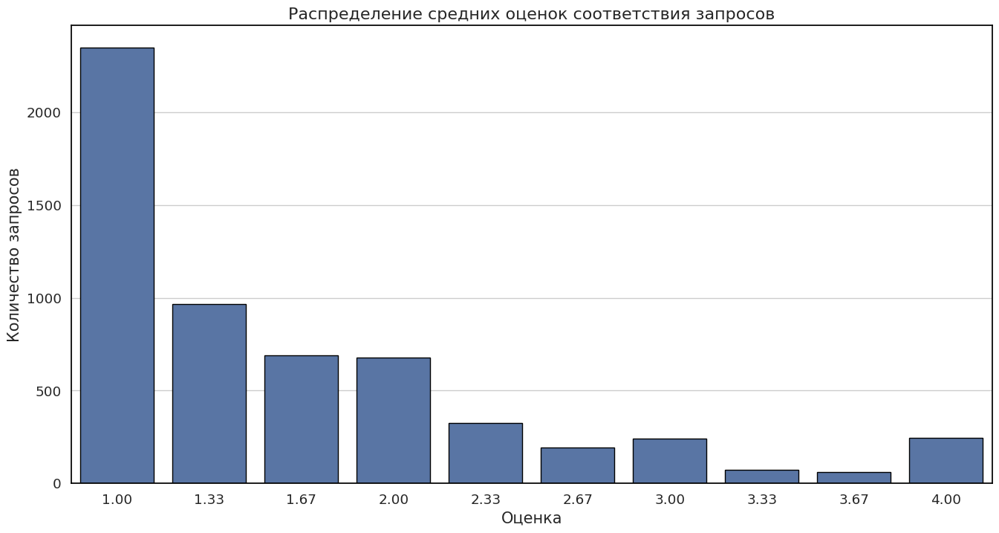

In [44]:
fig, ax = plt.subplots(figsize=(16, 8))
sns.barplot(df_train['exp_mean_score'].value_counts(),
            edgecolor='black',
            alpha=1,
            ax=ax)
plt.title('Распределение средних оценок соответствия запросов',
          fontsize=16)
plt.xlabel('Оценка', fontsize=15)
plt.ylabel('Количество запросов', fontsize=15)
ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()]);

- Видим, что есть какое-то количество изображений около 100, где все эксперты дали разные оценки
- Эксперт_1 занижает оценки, эксперт_3 - наоборот, завышает, а эксперт_2 сбалансированно между ними расположен
- С другой стороны, аггрегированные оценки моды и медианы почти везде дают похожий результат, кроме 2, 0 и 3, видимо, когда у всех экспертов разные оценки медиана чаще 2, и редко 3, поэтому из этих двух можно использовать медиану, кроме того, визуально они похожи на целую часть от средней оценки по всем экспертам
- Если средние оценки считать правильно, то получается в целом тоже неплохая картина, сравним ее позже с оценками краудсорсинга и там выберем либо среднюю, либо медиану, но я бы склонялся к средней, так как она повторяет медиану, если брать целую часть, но при этом дает более точную оценку, выбросов у нас тут нет

In [45]:
df_train.drop(exp_array_ + ['exp_mode_score'], axis=1, inplace=True)
del df_expert

In [46]:
scaler = MinMaxScaler()
df_train['exp_median_score'] = (scaler
                                .fit_transform(df_train['exp_median_score']
                                               .values.reshape(-1, 1))
                                .round(2))
df_train['exp_mean_score'] = (scaler
                              .fit_transform(df_train['exp_mean_score']
                                             .values.reshape(-1, 1))
                              .round(2))

In [47]:
df_train.head()

,image,query_id,query_text,exp_median_score,exp_mean_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.00,0.00
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.00,0.00
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.33,0.22
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.00,1.00
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.00,0.00


### `df_crowd`

Сразу объединим таким образом, чтобы остались только запросы, у которых есть текстовое описание

In [48]:
df_crowd = df_crowd.merge(df_train[['query_id', 'query_text']].drop_duplicates(),
                          on='query_id',
                          how='inner')
df_crowd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46721 entries, 0 to 46720
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             46721 non-null  object 
 1   query_id          46721 non-null  object 
 2   crowd_mean_score  46721 non-null  float64
 3   crowd_pos_count   46721 non-null  int64  
 4   crowd_neg_count   46721 non-null  int64  
 5   query_text        46721 non-null  object 
dtypes: float64(1), int64(2), object(3)
memory usage: 2.1+ MB


А здесь были запросы, для которых у нас нет текстового описания, целых 1109 штук (2.3 %), автоматом от них избавились

In [49]:
df_crowd['crowd_mean_score'] = df_crowd['crowd_mean_score'].round(2)
df_crowd['crowd_mean_score'].value_counts(normalize=True).sort_index()

,proportion
crowd_mean_score,
0.00,0.876094
0.17,0.000064
0.20,0.000471
0.25,0.002012
0.33,0.063398
0.40,0.000171
0.50,0.000578
0.60,0.000150
0.67,0.028852


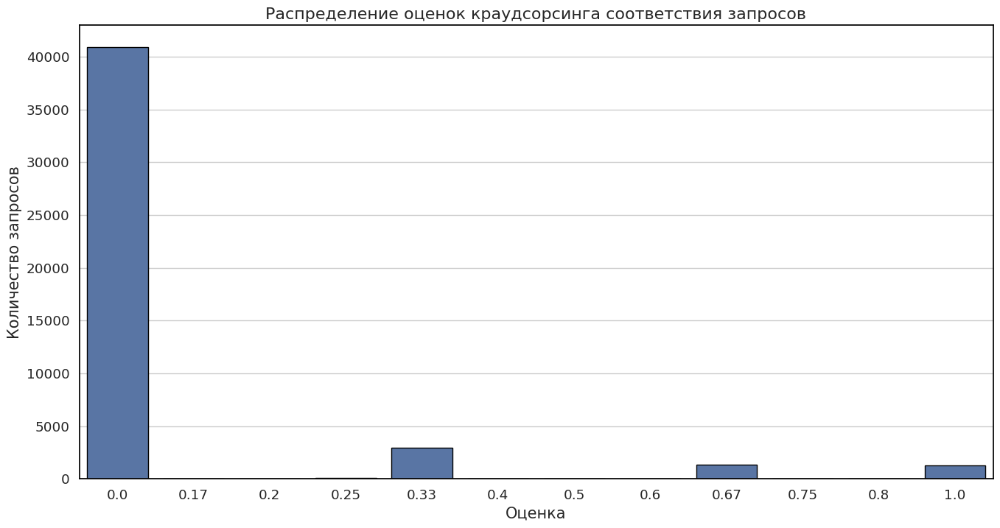

In [50]:
fig, ax = plt.subplots(figsize=(16, 8))
sns.barplot(df_crowd['crowd_mean_score'].value_counts(),
             edgecolor='black',
             alpha=1, ax=ax)
plt.title('Распределение оценок краудсорсинга соответствия запросов',
          fontsize=16)
plt.xlabel('Оценка', fontsize=15)
plt.ylabel('Количество запросов', fontsize=15);

- Система оценок краудсорсинга в целом похожа на медианную у экспертов, есть небольшие вкрапления вне 4 основных групп, когда количество пользователей было больше 3
- У некоторых изображений было более 1 полностью подходящего запроса, по мнению краудсорса, 1305 (2.8 %) пар с оценкой 1
- Попробуем посмотреть на корреляцию оценок краудсорсинга и экспертов на одинаковых парах. Для сравнения возьмем медианную оценку экспертов

In [51]:
df_compare = df_train.merge(df_crowd, on=['image', 'query_id'], suffixes=(None, '_'))
df_compare.drop('query_text_', axis=1, inplace=True)
df_compare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2329 entries, 0 to 2328
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             2329 non-null   object 
 1   query_id          2329 non-null   object 
 2   query_text        2329 non-null   object 
 3   exp_median_score  2329 non-null   float64
 4   exp_mean_score    2329 non-null   float64
 5   crowd_mean_score  2329 non-null   float64
 6   crowd_pos_count   2329 non-null   int64  
 7   crowd_neg_count   2329 non-null   int64  
dtypes: float64(3), int64(2), object(3)
memory usage: 145.7+ KB


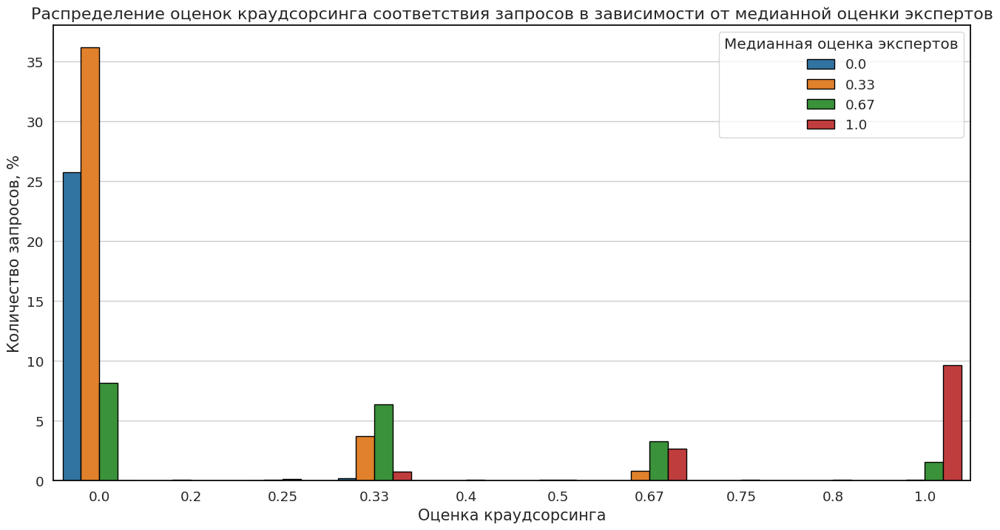

In [52]:
fig = plt.figure(figsize=(16, 8))
sns.countplot(
    data=df_compare,
    x='crowd_mean_score',
    hue='exp_median_score',
    stat='percent',
    palette='tab10',
    edgecolor='black',
    alpha=1
)
plt.title(
    'Распределение оценок краудсорсинга соответствия запросов '
    'в зависимости от медианной оценки экспертов',
    fontsize=16
)
plt.xlabel('Оценка краудсорсинга', fontsize=15)
plt.ylabel('Количество запросов, %', fontsize=15)
plt.legend(title='Медианная оценка экспертов');

- Всего для сравнения набралось 2329 пар, немного меньше 50 % датасета с оценками экспертов
- Краудсорсинг заметно занижает оценки соответствия пар по сравнению с экспертами, которым мы доверяем больше, со слов заказчика - они ж эксперты
- Встает выбор, объединять наш датасет с датасетом краудсорсинга
    - С одной стороны, почти в 10 раз пар запрос-изображение, то есть заметно вырастет обучающая выборка, но 88 % (около 42 тыс.) запросов полностью не подходят ни под одно изображение по мнению краудсорсинга, причем из этих запросов, а так же с более высокой оценкой какая-то часть может все-таки подходить больше к изображению, чем оценили краудсорсеры. То есть мы из желания лучше научить модель определять то, чего нет на изображении можем лишиться значительной её описательной силы на какие-то детали изображения, например на изображении `пасмурное или дождливое небо`, а в описании `облачное небо` и аутсорсеры с занижением оценки могли поставить 0 в итоге, а не 0.33 или 0.67, что сделает труднее связку неба в запросе и на изображении для модели, то же касается и положительных пар
    - С другой стороны, можно не использовать оценки краудсорсинга, да выборка будет меньше, но уверенность в качестве разметки будет сильно выше
- Посмотрим качественно на всю эту ситуацию, чтобы лучше понять разницу в оценках

In [53]:
compare_datagen = ImageDataGenerator(rescale=1/255.)

def image_comparison(dataset):
    compare_flow = compare_datagen.flow_from_dataframe(
        dataset,
        directory=os.path.join(DATA_PATH,
                              'train_images'),
        x_col='image',
        y_col=['query_text',
               'exp_median_score',
               'exp_mean_score',
               'crowd_mean_score'],
        target_size=(256, 256),
        batch_size=32,
        shuffle = False,
        class_mode='raw',
        seed=SEED
    )

    compare_features, compare_target = next(compare_flow)

    fig = plt.figure(figsize=(16, 16))
    plt.suptitle('Примеры пар изображений, оценок и текстовых запросов\n')
    for i in range(9):
        fig.add_subplot(3, 3, i+1)
        plt.imshow(compare_features[i])
        plt.xticks([])
        plt.yticks([])
        plt.title(
            f'Краудсорс: {compare_target[i][3]:>9}'.rjust(45) +
            f'\nЭксперты (медиана|средняя): {compare_target[i][1]} | {compare_target[i][2]}',
            fontsize=15,
            multialignment='center'
        )
        plt.xlabel('\n'.join(wrap(compare_target[i][0], 40)), multialignment='center')
        plt.tight_layout()

Посмотрим на случаи, когда краудсорсинг давал оценку 0, а эксперты больше 0.6 по медиане

Found 191 validated image filenames.


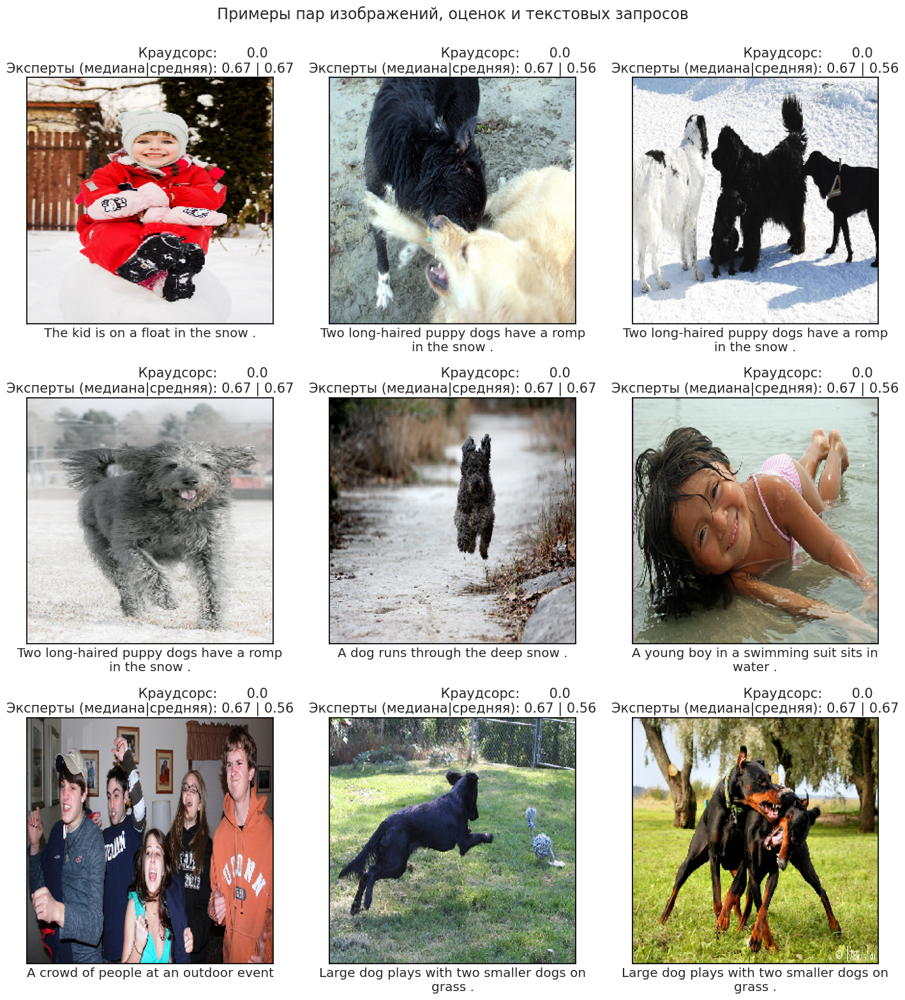

In [54]:
image_comparison(df_compare.query('crowd_mean_score==0.0 & exp_median_score>0.6'))

- Экспертная оценка показывает наличие частичного пересечения запроса и контекста изображения, например
    - в запросе - `Большая собака играет с двумя маленькими собаками на траве`
    - на изображении - `Одна или две собаки играют на траве`
    - краудсорс ставит 0, а эксперты ставят 0.67 по медиане или 0.56 / 0.67 среднюю оценку. Причем в средней оценке у экспертов 0.56 для одной собаки, играющией на траве, и 0.67 для двух, что говорит в пользу выбора средней экспертной оценки как более точно отражающей контекст

Посмотрим на пары, где краудсорс поставил 1, а эксперты меньше 1

Found 39 validated image filenames.


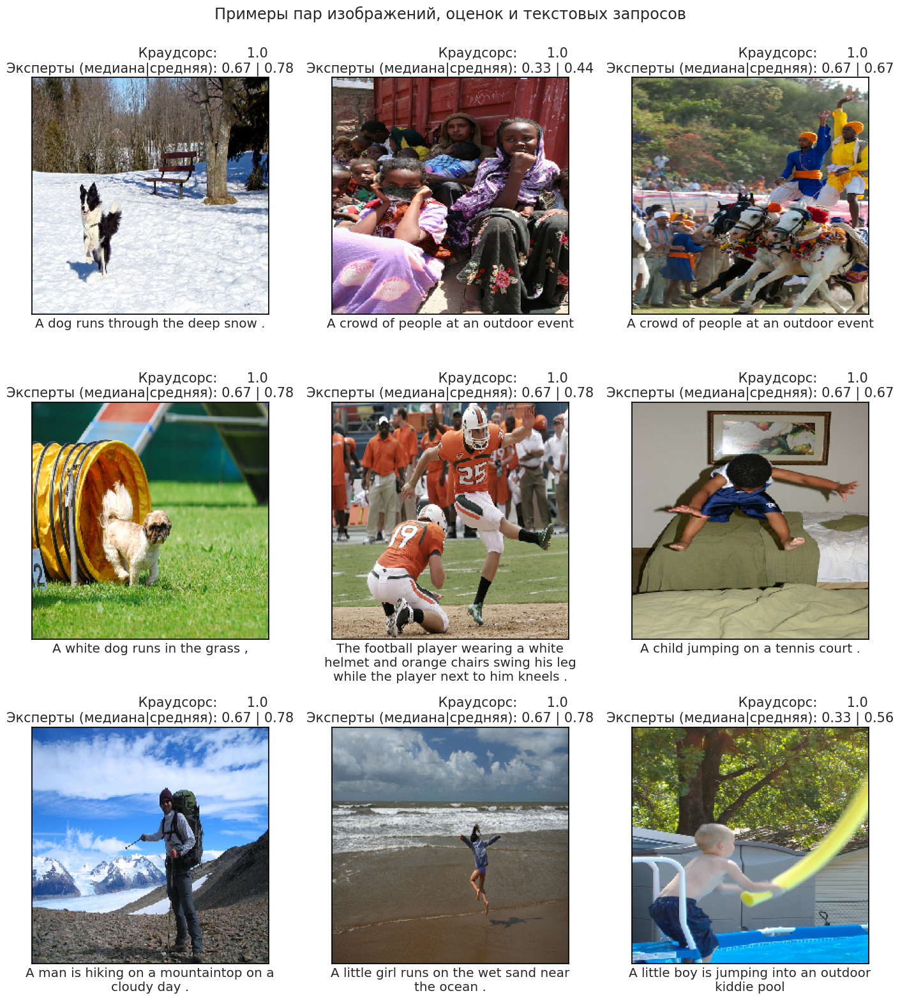

In [55]:
image_comparison(df_compare.query('crowd_mean_score==1.0 & exp_median_score<1'))

- Много случаев, когда краудсорс будто правильно ставит 1, хотя возможно им не выдавался более точный вариант запроса в выборке, а возможно показывали только 1 пару запроса-изображения. С одной стороны, в боевом варианте такой подход оценки краудсорсинга будет лучше, с другой все будет зависеть от количества пар, не хватит экспертов на все это дело и надо будет что-то придумывать еще, например пользователь при загрузке изображения должен описать, что на ней происходит
- Средняя оценка экспертов лучше отражает контекст, чем медианная
- Процент, когда нельзя согласиться с краудсорсерами уже не такой большой

Посомотрим, наконец на совпадения оценок краудсорса и экспертов

Found 388 validated image filenames.


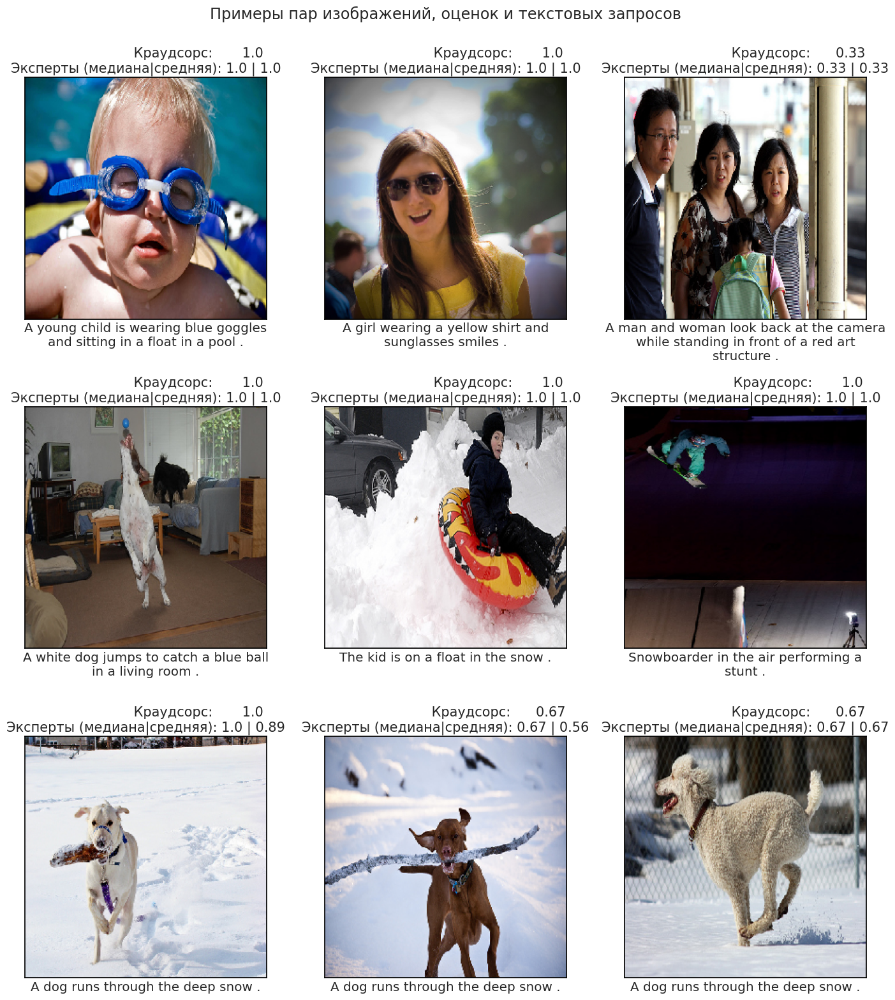

In [56]:
image_comparison(df_compare.query('crowd_mean_score==exp_median_score & crowd_mean_score>0.0'))

- Тут в целом все понятно, средняя оценка экспертов опять как будто лучше подходит к контексту изображения
- Можно брать среднюю оценку экспертов для пар, где есть и оценки краудсорсинга, а там где нет - что-то одно
- Можно взять только среднюю оценку экспертов
- Посмотрим просто по результатам моделей на этапе обучения, а пока сделаем два варианта датасетов

In [57]:
df_train.drop('exp_median_score', axis=1, inplace=True)

### Возрастные юридические ограничения

Подготовим текстовые запросы

- Почистим от спецсимволов и приведем к нижнему регистру
- Лемматизируем для поиска запросов, содержащих упоминания людей до 16 лет

In [58]:
df_query_prep = df_train[['query_id', 'query_text']].drop_duplicates()

In [59]:
nlp = spacy.load('en_core_web_sm')
stopwords = nlp.Defaults.stop_words

In [60]:
def cleaner(text):
    # Убираем интернет-ссылки, спецсимволы, оставляем только текст и приводим к нижнему регистру
    text = re.sub(r'(?:(?:https?|ftp):\/\/)?[\w/\-?=%.]+\.[\w/\-&?=%.]+|\d+', '', text)
    text = re.sub(r'[^ a-zA-Z]+', '', text)

    return text.lower()

In [61]:
df_query_prep['query_text'] = df_query_prep['query_text'].progress_apply(cleaner)

  0%|          | 0/977 [00:00<?, ?it/s]

In [62]:
def lemmatize_pipe(doc):
    lemma_list = [str(tok.lemma_).lower() for tok in doc
                  if tok.is_alpha and tok.text.lower() not in stopwords]
    return lemma_list

def preprocess_pipe(texts):
    preproc_pipe = []
    for doc in tqdm(nlp.pipe(texts, n_process=-1),
                    total=len(texts)):
        preproc_pipe.append(lemmatize_pipe(doc))
    return preproc_pipe

In [63]:
df_query_prep['lemma_q_text'] = preprocess_pipe(df_query_prep['query_text'])

  0%|          | 0/977 [00:00<?, ?it/s]

In [64]:
minor_set = set([
    'adolescent',
    'baby',
    'babies',
    'boy',
    'child',
    'children',
    'girl',
    'infant',
    'junior',
    'juvenile',
    'newborn',
    'teenager',
    'youngster',
    'youth',
    'lad',
    'schoolboy',
    'schoolgirl',
    'pupil',
    'underage',
    'kid',
    'kiddie',
    'youngling',
    'toddler',
    'teen',
    'juvenile',
    'adolescent',
    'kiddy',
    'teenager',
    'youngster',
    'tween',
    'moppet',
    'kiddo',
    'youth',
    'classmate'
])

df_query_prep['minor_restrict'] = df_query_prep['lemma_q_text'].apply(
    lambda x: True if minor_set.intersection(set(x)) else False
)

In [65]:
display(df_query_prep.head())
print('Записей, поподающих под ограничения - ',
      df_query_prep.query('minor_restrict==True').shape[0])

,query_id,query_text,lemma_q_text,minor_restrict
0,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,"[young, child, wear, blue, goggle, sit, float,...",True
12,2718495608_d8533e3ac5.jpg#2,a girl wearing a yellow shirt and sunglasses s...,"[girl, wear, yellow, shirt, sunglasse, smile]",True
22,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street,"[man, sleep, blanket, city, street]",False
27,3207358897_bfa61fa3c6.jpg#2,a woman plays with long red ribbons in an empt...,"[woman, play, long, red, ribbon, square]",False
31,3286822339_5535af6b93.jpg#2,chinese market street in the winter time,"[chinese, market, street, winter, time]",False


Записей, поподающих под ограничения -  293


Теперь получим список изображений, которые содержат изображения детей и подростков. Выше мы отмечали, что запрос `query_id` строится из названия фотографии + `#2`, поэтому просто у всех подходящих под ограничения запросов уберем суффикс и получим список изображений

In [66]:
restrict_images = df_query_prep.query('minor_restrict==True')['query_id'].apply(
    lambda x: x[:-2]
)
print('Изображений с людьми до 16 лет - ', len(restrict_images))

Изображений с людьми до 16 лет -  293


Уберем все пары содержащие эти изображения

In [67]:
df_train = df_train.query('image not in @restrict_images')
df_crowd = df_crowd.query('image not in @restrict_images')
df_train = (
    df_train
    .drop('query_text', axis=1)
    .merge(df_query_prep[['query_id', 'query_text']], on='query_id', how='left')
)
df_train.info()
print('\nУникальных изображений - ', df_train['image'].nunique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4067 entries, 0 to 4066
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           4067 non-null   object 
 1   query_id        4067 non-null   object 
 2   exp_mean_score  4067 non-null   float64
 3   query_text      4067 non-null   object 
dtypes: float64(1), object(3)
memory usage: 127.2+ KB

Уникальных изображений -  707


In [68]:
df_crowd.info()
print('\nУникальных изображений - ', df_crowd['image'].nunique())

<class 'pandas.core.frame.DataFrame'>
Index: 33372 entries, 0 to 46720
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             33372 non-null  object 
 1   query_id          33372 non-null  object 
 2   crowd_mean_score  33372 non-null  float64
 3   crowd_pos_count   33372 non-null  int64  
 4   crowd_neg_count   33372 non-null  int64  
 5   query_text        33372 non-null  object 
dtypes: float64(1), int64(2), object(3)
memory usage: 1.8+ MB

Уникальных изображений -  707


- Отлично, осталось 4067 пар изображний-запрос и 707 уникальных изображений в `df_train`
- 33372 пары и 707 уникальных изображений в `df_crowd`

### Создание общей выборки

In [69]:
df_train_ext = pd.merge(
    df_crowd[['image', 'query_id', 'crowd_mean_score']],
    df_train[['image', 'query_id', 'exp_mean_score']],
    on=['image', 'query_id'],
    how='outer',
).merge(df_query_prep[['query_id', 'query_text']], on='query_id', how='left')
df_train_ext.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35705 entries, 0 to 35704
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             35705 non-null  object 
 1   query_id          35705 non-null  object 
 2   crowd_mean_score  33372 non-null  float64
 3   exp_mean_score    4067 non-null   float64
 4   query_text        35705 non-null  object 
dtypes: float64(2), object(3)
memory usage: 1.4+ MB


Отлично, получилось два датасета
- `df_train` - только с экспертными оценками
- `df_train_ext` - с оценками экспертов и краудсорсинга, сделаем из них один таргет (экспертная оценка если есть, если она отсутствует, то краудсорс оценка)

In [70]:
df_train_ext['score'] = df_train_ext['exp_mean_score'].where(
    ~df_train_ext['exp_mean_score'].isna(), other=df_train_ext['crowd_mean_score'])
df_train_ext.drop(['crowd_mean_score', 'exp_mean_score'], axis=1, inplace=True)
df_train_ext.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35705 entries, 0 to 35704
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       35705 non-null  object 
 1   query_id    35705 non-null  object 
 2   query_text  35705 non-null  object 
 3   score       35705 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB


In [71]:
df_train.rename(columns={'exp_mean_score': 'score'}, inplace=True)

In [72]:
del df_crowd

### Вывод

- В целом эксперты более менее согласованны, хотя есть редкие случаи вроде (1, 3, 3) или (1, 4, 4) например, один из них чаще завышает, другой занижает, а третий между ними
- В качестве агрегации оценок выбрали среднее арифметическое из моды, медианы и среднего
- Краудсорсинг заметно занижает оценки соответствия пар по сравнению с экспертами. Сделали два варианта датасетов
    - `df_train` - только с экспертными оценками - 4067 пар
    - `df_train_ext` - с оценками экспертов и краудсорсинга, (экспертная оценка если есть, если она отсутствует, то краудсорс оценка) - 35000 пар
- Убрали 293 изображения  и соответствующих запросов из тренировочных данных, в соответствии с юридическими ограничениями

## Подготовка данных

### Векторизация текстов

- Возьмем последний скрытый слой из BERT модели
- Так как тексты разной длины, он доводятся паддинггом до равной длины, но для обучения под нашу задачи 0 паддинга будут мешать, поэтому на каждый эмбеддинг применим маску, чтобы не учитывать 0 паддинга

In [73]:
bert_model = TFBertModel.from_pretrained('bert-base-uncased')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [74]:
def get_text_embedding(text, max_len=64):
    tokens = tokenizer(text, padding='max_length', truncation=True, max_length=max_len, return_tensors='tf')
    input_ids = tokens.input_ids
    attention_mask = tf.cast(tokens.attention_mask, dtype=tf.float32)

    outputs = bert_model(input_ids, attention_mask=tokens.attention_mask, training=False)
    last_hidden = outputs.last_hidden_state

    mask = tf.expand_dims(attention_mask, axis=-1)
    masked_hidden = last_hidden * mask

    sum_hidden = tf.reduce_sum(masked_hidden, axis=1)
    counts = tf.reduce_sum(mask, axis=1)
    emb = sum_hidden / counts
    return tf.squeeze(emb, axis=0)  # (768)

In [75]:
def df_text_to_emb(df):
    unique_texts = df['query_text'].unique()
    text_embedding_map = {
        text: get_text_embedding(text).numpy()
        for text in unique_texts
    }
    df['text_emb'] = df['query_text'].map(text_embedding_map)

In [76]:
df_text_to_emb(df_train)

### Векторизация изображений

Здесь возьмем последний скрытый слой из ViT модели, в ней используются патчи, что по идее должно помочь при сведении векторов

In [77]:
model_name = 'google/vit-base-patch16-224-in21k'
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name)
vit_model = TFViTModel.from_pretrained(model_name)

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


In [78]:
def get_image_embedding(img_path):
    image = Image.open(img_path).convert("RGB")
    inputs = feature_extractor(images=image, return_tensors="tf")
    outputs = vit_model(**inputs)
    cls_embedding = outputs.last_hidden_state[:, 0]
    return cls_embedding.numpy().squeeze()

In [79]:
def df_image_to_emb(df, folder):
    unique_images = df['image'].unique()
    image_embedding_map = {
        image: get_image_embedding(os.path.join(DATA_PATH, folder, image))
        for image in unique_images
    }
    df['image_emb'] = df['image'].map(image_embedding_map)

In [80]:
df_image_to_emb(df_train, TRAIN_IMAGES_DIR)

Отлично, векторизовали тексты и изображения с помощью BERT и ViT, используя их бэкбоны, теперь будем пробовать сводить эти вектора вместе с помощью модели

### Создание обучающей и валидационной выборки

In [81]:
gss = GroupShuffleSplit(n_splits=3, train_size=0.8, random_state=RANDOM_STATE)
train_idx, val_idx = next(gss.split(df_train, y=df_train['score'], groups=df_train['image']))
train_df = df_train.iloc[train_idx].reset_index(drop=True)
val_df = df_train.iloc[val_idx].reset_index(drop=True)

X_text_train = np.stack(train_df['text_emb'].values)
X_image_train = np.stack(train_df['image_emb'].values)
y_score_train = train_df['score'].values.astype(np.float32)

X_text_val = np.stack(val_df['text_emb'].values)
X_image_val = np.stack(val_df['image_emb'].values)
y_score_val = val_df['score'].values.astype(np.float32)

### Вывод

- Векторизовали тексты и изображения с помощью BERT и ViT последними скрытыми слоями моделей
- Из текстового эмбеддинга убрали влияние нулей паддинга маской

## Подбор и обучение моделей

- Будем сравнивать модели по RSME разницы косинусого расстояния и `score`
- Для бейзлайна возьмем Dummy Regressor

### Dummy

In [82]:
X_train = np.concatenate([X_text_train, X_image_train], axis=1)
X_val = np.concatenate([X_text_val, X_image_val], axis=1)

model_scaler = MinMaxScaler()

X_train_scaled = model_scaler.fit_transform(X_train)
X_valid_scaled = model_scaler.transform(X_val)

In [83]:
dummy = DummyRegressor()
dummy.fit(X_train, y_score_train)
rmse_dummy_train = root_mean_squared_error(y_score_train, dummy.predict(X_train))
rmse_dummy_val = root_mean_squared_error(y_score_val, dummy.predict(X_val))
print(f'RMSE Dummy модели на обучении - {rmse_dummy_train:.4f}')
print(f'RMSE Dummy модели на валидации - {rmse_dummy_val:.4f}')

RMSE Dummy модели на обучении - 0.2798
RMSE Dummy модели на валидации - 0.2960


Отлично, бейзлайн в 0.28 есть, теперь можно будет хоть как-то оценивать обучение моделей

### Linear Regression

In [84]:
lr = LinearRegression(fit_intercept=False)
lr.fit(X_train_scaled, y_score_train)
rmse_lr_train = root_mean_squared_error(y_score_train, lr.predict(X_train))
rmse_lr_val = root_mean_squared_error(y_score_val, lr.predict(X_val))
print(f'RMSE линейной регрессии на обучении - {rmse_lr_train:.4f}')
print(f'RMSE линейной регрессии на валидации - {rmse_lr_val:.4f}')

RMSE линейной регрессии на обучении - 0.3962
RMSE линейной регрессии на валидации - 0.5796


Линейная регрессия заметно хуже бейзлайна, а на валидации вообще просела, как будто переобучение. По идее оно возникло из-за того, что эмбединги длиной 768 для текстов и изображений, то есть 1536 признаков, причем они все нормированы, и значит наверняка есть зависимости между признаками, корреляции

### Text-Image Retrieval NN

Попробуем собрать нейронную архитектуру. Сделаем функцию проекционной головы, энкодеры для векторов текста и изображения, чтобы на инференсе было проще получать вектора. По-хорошему надо бы сделать хороший загрузчик батча, где у нас одному текстовому запросу шли вместе связанные изображение по таблице и оценки их соответствия, и тогда можно было считать soft contrastive loss. Функцию для лосса легко реализовать, а вот с батчами трудновато, чтобы еще по ресурсам не выйти за возможности

In [85]:
def deep_projection_head(inputs, output_dim=256, dropout_rate=0.2, num_heads=2):

    out = layers.Dense(output_dim)(inputs)
    for i in range(num_heads):
        x = layers.Activation('gelu')(out)
        x = layers.Dense(output_dim)(x)
        x = layers.Dropout(dropout_rate)(x)
        x = layers.Add()([out, x])
        out = layers.LayerNormalization()(x)

    return out

In [86]:
def create_vision_encoder(
    num_heads, projection_dims, dropout_rate, trainable=False, embedding_dim_image=768
):
    image_input = Input(shape=(embedding_dim_image,), name='image_input')
    output = deep_projection_head(
        image_input, projection_dims, dropout_rate, num_heads
    )
    return Model(image_input, output, name='vision_encoder')

In [87]:
def create_text_encoder(
    num_heads, projection_dims, dropout_rate, trainable=False, embedding_dim_text=768
):
    text_input = Input(shape=(embedding_dim_text,), name='text_input')
    output = deep_projection_head(
        text_input, projection_dims, dropout_rate, num_heads
    )
    return Model(text_input, output, name='text_encoder')

In [88]:
def build_model(
    text_encoder, vision_encoder, embedding_dim_image=768, embedding_dim_text=768
):
    text_input = Input(shape=(embedding_dim_text, ), name='text_input')
    image_input = Input(shape=(embedding_dim_image, ), name='image_input')
    with tf.device('/gpu:0'):
        text_proj = text_encoder(text_input)
    with tf.device('/gpu:1'):
        image_proj = vision_encoder(image_input)
    cosine_sim = layers.Dot(axes=1, normalize=True)([text_proj, image_proj])
    sim_scaled = layers.Lambda(lambda x: (x + 1) / 2)(cosine_sim)

    return Model(inputs=[text_input, image_input], outputs=(sim_scaled))

In [89]:
vision_encoder = create_vision_encoder(num_heads=1,
                                       projection_dims=768,
                                       dropout_rate=0.2,
                                       embedding_dim_image=768)
text_encoder = create_text_encoder(num_heads=1,
                                   projection_dims=768,
                                   dropout_rate=0.2,
                                   embedding_dim_text=768)
NN_model = build_model(text_encoder,
                       vision_encoder,
                       embedding_dim_image=768,
                       embedding_dim_text=768)

NN_model.compile(
    optimizer=tf.keras.optimizers.Adam(5e-4),
    loss='mse',
    metrics=['root_mean_squared_error']
)

In [90]:
NN_model.fit(
    x=[X_text_train, X_image_train],
    y=y_score_train,
    validation_data=([X_text_val, X_image_val], y_score_val),
    batch_size=64,
    epochs=20,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)
    ]
)

Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.0895 - root_mean_squared_error: 0.2980 - val_loss: 0.0649 - val_root_mean_squared_error: 0.2548
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0511 - root_mean_squared_error: 0.2260 - val_loss: 0.0540 - val_root_mean_squared_error: 0.2324
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0412 - root_mean_squared_error: 0.2028 - val_loss: 0.0520 - val_root_mean_squared_error: 0.2281
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0365 - root_mean_squared_error: 0.1909 - val_loss: 0.0515 - val_root_mean_squared_error: 0.2269
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0335 - root_mean_squared_error: 0.1829 - val_loss: 0.0513 - val_root_mean_squared_error: 0.2264
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0311 - root_mean_squared_error: 0.1763 - val_loss: 0.0514 - val_root_mean_squared_error: 0.2268
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.029

RMSE на валидации около 0.228, лучше чем Dummy модель, но все равно многовато скорее всего. Из множества разных попыток получалось достичь 0.2 на другой архитектуре и InceptionResNetV2 вместо ViT

### Инференс

In [91]:
test_images_emb = df_test['image'].unique()
image_embeddings = [get_image_embedding(os.path.join(DATA_PATH, TEST_IMAGES_DIR, image))
                    for image in test_images_emb]
image_embeddings = np.stack(image_embeddings)

In [92]:
image_proj_matrix = vision_encoder.predict(image_embeddings, batch_size=64, verbose=0)
image_proj_matrix = image_proj_matrix / np.linalg.norm(image_proj_matrix, axis=1, keepdims=True)

In [93]:
def find_top_k_matches(query_text, top_k=5, clip=False):

    print(f'Введенная фраза:{query_text} \n')
    query_text = cleaner(query_text)
    text_lemm = lemmatize_pipe(nlp(query_text))
    for word in text_lemm:
        if word in minor_set:
            return print('This image is unavailable in your country in compliance with local laws\n')

    if clip==False:
        text_emb = get_text_embedding(query_text).numpy().reshape(1, -1)
        text_proj = text_encoder.predict(text_emb, verbose=0)
    else:
        text_proj = get_clip_text_emb(query_text)
    text_proj = text_proj / np.linalg.norm(text_proj)


    sims = np.dot(image_proj_matrix, text_proj.T).flatten()
    sims = (sims + 1) / 2

    # Топ-k индексов по убыванию
    top_indices = np.argsort(sims)[::-1][:top_k]
    top_matches = [(test_images_emb[i], sims[i]) for i in top_indices]

    # Визуализация
    n_cols = min(top_k, 5)
    n_rows = (top_k + n_cols - 1) // n_cols

    plt.figure(figsize=(n_cols * 3, n_rows * 3))
    plt.suptitle(f'Запрос: "{query_text}"', fontsize=16)

    for idx, (filename, sim) in enumerate(top_matches):
        img_path = os.path.join(DATA_PATH, TEST_IMAGES_DIR, filename)
        img = Image.open(img_path)

        plt.subplot(n_rows, n_cols, idx + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{sim:.2f}", fontsize=10)

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

In [94]:
def evaluate_model_on_random_queries(df_test, top_k=5, num_queries=10, clip=False):
    queries = df_test['query_text'].unique()
    sampled_queries = random.sample(list(queries), num_queries)
    for query in sampled_queries:
        find_top_k_matches(query, top_k=top_k, clip=clip)

Введенная фраза:A girl in a cape along with other costumed children 

This image is unavailable in your country in compliance with local laws

Введенная фраза:A woman and a younger girl , both wearing blue jackets and knit caps , slide down a hill on a snow sled , a dog running at their side . 

This image is unavailable in your country in compliance with local laws

Введенная фраза:a tan dog wearing a multicolored color running on the beach 



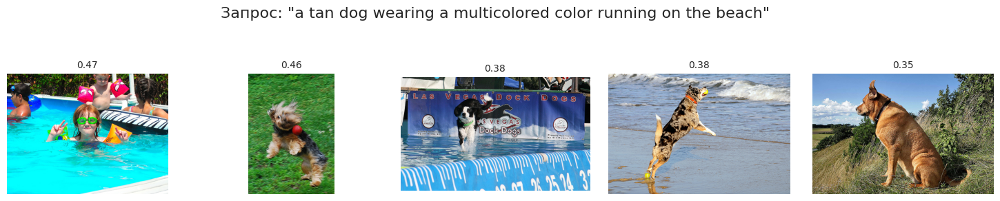

Введенная фраза:The light colored dog is running through a field . 



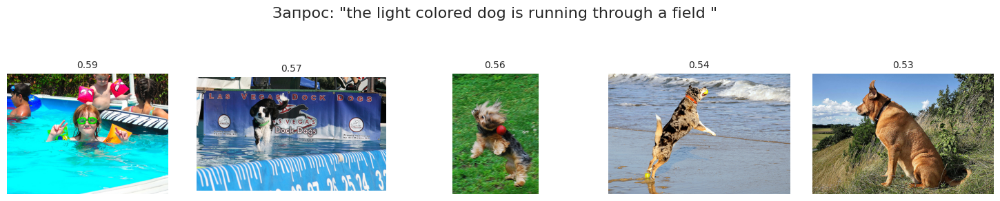

Введенная фраза:a lone man sitting on a ledge that overlooks the beach 



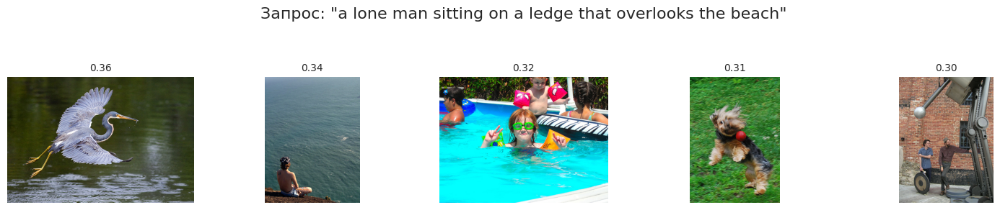

Введенная фраза:A dog is jumping into a pool for a swim competition 



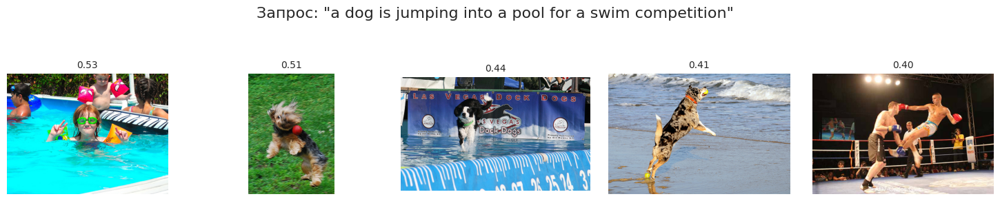

Введенная фраза:The little girl in the yellow hat is buried up to her waist in the sand on the beach . 

This image is unavailable in your country in compliance with local laws

Введенная фраза:An Arabic man in a white hat . 



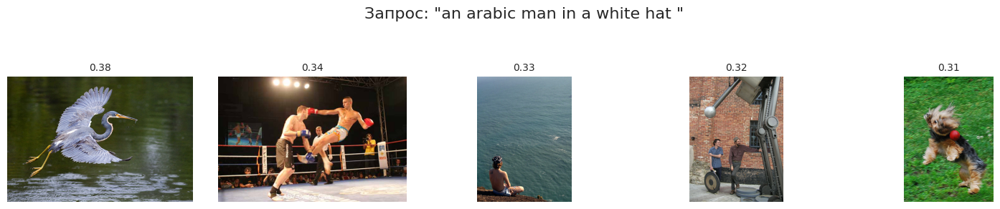

Введенная фраза:Two women are operating a laptop connected to a camera in a parking lot with a third person standing by . 



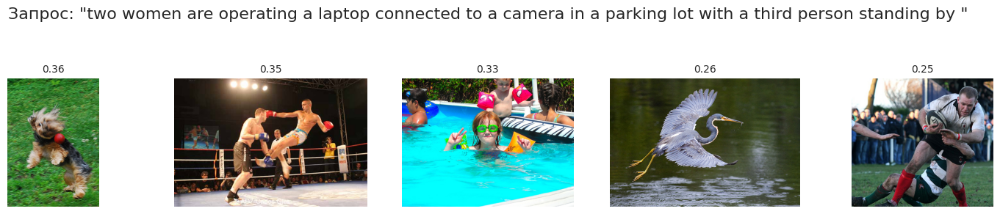

Введенная фраза:Two black dogs are fighting over a toy 



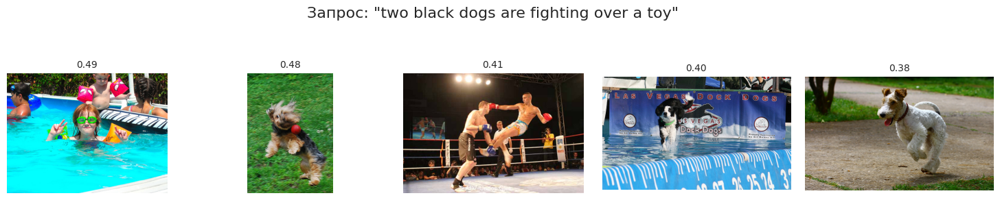

In [95]:
evaluate_model_on_random_queries(df_test, top_k=5, num_queries=10)

Даа, вышло так себе, попробуем предобученный CLIP, потому что такой вариант заказчику не стоит показывать

### CLIP

Посмотрим на предобученную CLIP модель

In [96]:
clip_model = TFCLIPModel.from_pretrained('openai/clip-vit-base-patch32')
clip_processor = CLIPProcessor.from_pretrained('openai/clip-vit-base-patch32')

config.json: 0.00B [00:00, ?B/s]

tf_model.h5:   0%|          | 0.00/606M [00:00<?, ?B/s]

All model checkpoint layers were used when initializing TFCLIPModel.

All the layers of TFCLIPModel were initialized from the model checkpoint at openai/clip-vit-base-patch32.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFCLIPModel for predictions without further training.
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [97]:
def get_clip_text_emb(text):
    inputs = clip_processor(text=[text], return_tensors='tf')
    outputs = clip_model.get_text_features(**inputs)
    return outputs.numpy().squeeze()

def get_clip_image_emb(img_path):
    image = Image.open(img_path).convert('RGB')
    inputs = clip_processor(images=image, return_tensors='tf')
    outputs = clip_model.get_image_features(**inputs)
    return outputs.numpy().squeeze()

In [98]:
image_proj_matrix = [get_clip_image_emb(os.path.join(DATA_PATH, TEST_IMAGES_DIR, image))
                        for image in test_images_emb]
image_proj_matrix = np.stack([vec / np.linalg.norm(vec) for vec in image_proj_matrix])

Введенная фраза:A man holds feed for a horse in a blue blanket . 



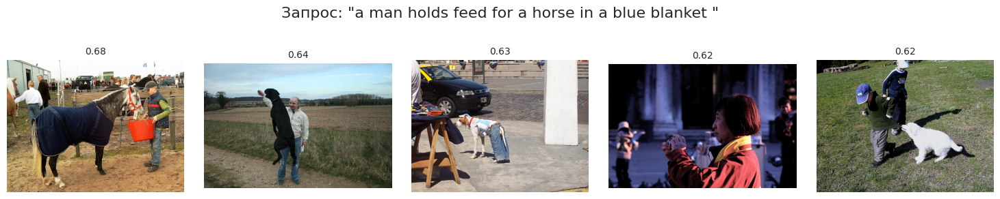

Введенная фраза:a group of teenagers standing outside of a convienance store . 

This image is unavailable in your country in compliance with local laws

Введенная фраза:a blond man jumping off a cliff into some water 



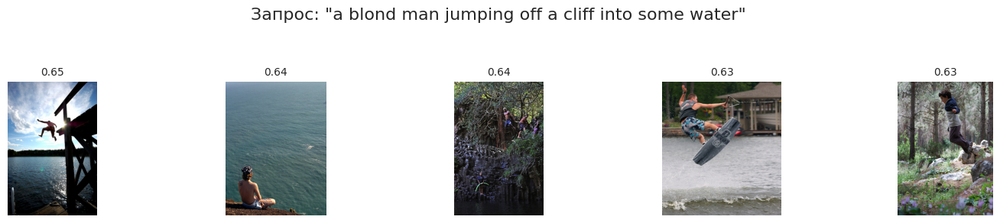

Введенная фраза:A girl in a bikini top stands in front of a beautiful view . 

This image is unavailable in your country in compliance with local laws

Введенная фраза:A boy in a blue shirt standing by a lake shore . 

This image is unavailable in your country in compliance with local laws

Введенная фраза:Two men standing at the feet of a large sculpture . 



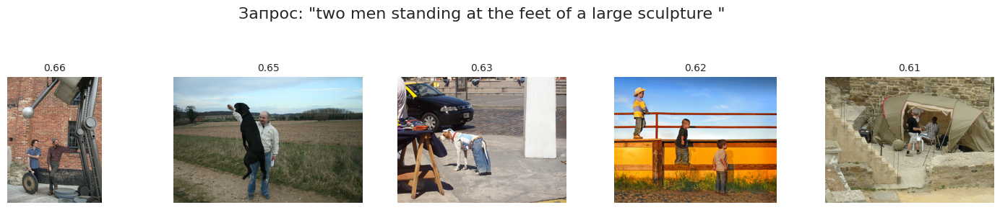

Введенная фраза:A large tan dog sits on a grassy hill . 



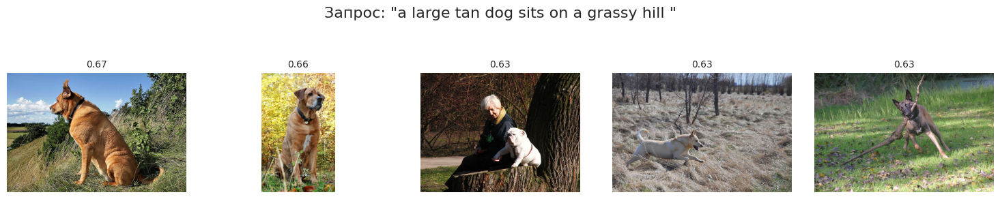

Введенная фраза:A small white dog is carrying something blue in its mouth and a bigger brown and black dog is carrying something orange in its mouth . 



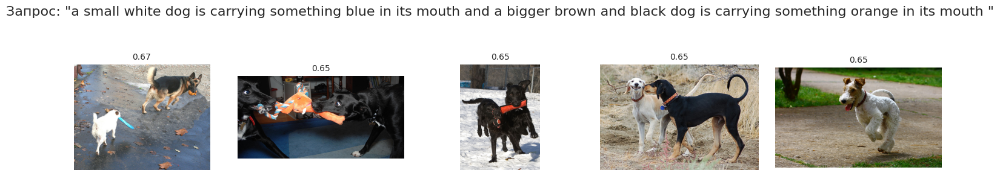

Введенная фраза:An outdoor ice skating rink full of people . 



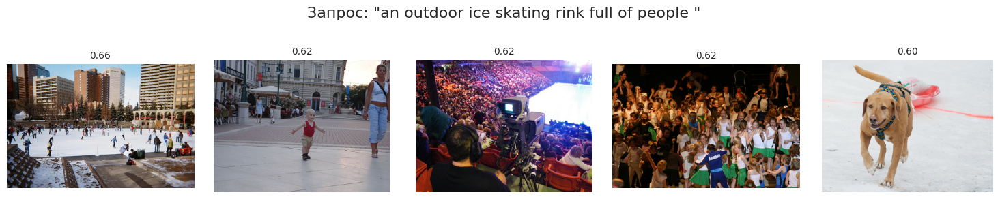

Введенная фраза:A group of people gather on the grass field and throw a pink hoop . 



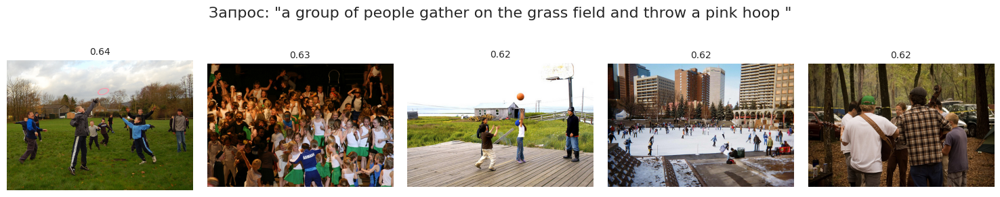

In [99]:
evaluate_model_on_random_queries(df_test, top_k=5, num_queries=10, clip=True)

Да, этот вариант явно лучше. Но необходимо заметить, что хоть мы и сделали юридический фильтр по запросу, изображения с детьми проскакивают, значит заказчику надо будет рекомендовать подумать об отдельной функции на этот счет

## Общий вывод

В рамках проекта была создана модель поиска изображений по текстовому запросу на основе **BERT** и **ViT**, которая показала метрику **RMSE 0.228** на валидации, но по факту оказалось не достаточно, для улучшения результатов была использована предобученная модель CLIP, которая показывает хорошие результаты.

**Входные данные**
- Всего записей
    - `df_train` - 5822
    - `df_expert` - 5822
    - `df_crowd` - 47830
- В каждом 1000 уникальных объектов изображений

**Исследовательский анализ**
- В целом эксперты более менее согласованны, хотя есть редкие случаи вроде (1, 3, 3) или (1, 4, 4) например, один из них чаще завышает, другой занижает, а третий между ними
- В качестве агрегации оценок выбрали среднее арифметическое из моды, медианы и среднего
- Краудсорсинг заметно занижает оценки соответствия пар по сравнению с экспертами. Сделали два варианта датасетов
    - `df_train` - только с экспертными оценками - 4067 пар
    - `df_train_ext` - с оценками экспертов и краудсорсинга, (экспертная оценка если есть, если она отсутствует, то краудсорс оценка) - 35000 пар
- Убрали 293 изображения  и соответствующих запросов из тренировочных данных, в соответствии с юридическими ограничениями

**Text-Image Retrieval модель**
- RMSE на валидации
    - **Baseline** Dummy модель - 0.296
    - Linear Regression - 0.58
    - Custom NN - 0.228

- В кастомной NN использовали проекционные головы, энкодеры для векторов текста и изображения
- На инференсе показала себя плохо
- Вероятно помогло бы кастомный загрузчик батчей, где у нас одному текстовому запросу шли вместе связанные изображение по таблице и оценки их соответствия
- Soft Contrastive Loss
- Для быстрого решения вопроса была использована предобученная CLIP модель от OpenAI, которая показала отличные результаты
- Ее так же можно дообучить на нашей выборке для дальнейшей работы, для текущей задачи демонстрационного варианта она подходит и так

**Возможные улучшения модели**
- Кастомный загрузчик батча и данных, скорее всего кастомный трейнер
- Soft Contrastive Loss
- Как вариант дообучить CLIP

**Рекомендации заказчику и комментарии по поводу предоставленной выборки**
- Повысить надежность краудсорса, возможно через вознаграждение, чтобы точность оценок была выше и можно было дообучать модель
- Добавить возможность или как обязательный вариант, при загрузке пользователем изображения на сайт - обязательно заполнить краткое описание
- Фильтрацию по изображениям в юридическом контексте сделать отдельно, так как только текстовой фильтрации недостаточно, если реализовать функцию выдачи топ-N изображений по запросу, модель может выдать изображение, где будут дети